# EDA & Reformatting of the FAIR1M dataset
This notebook is intended to run offline on the full 50Gb FAIR1M dataset.  It does the following:
- Expores the labelling data format and raster image formats
- Converts from geoTiff rasters to jpg, so they can be stored and moved more easily
- Extracts the xml labels, and any spatial data
- Converts labels and vector data to Pandas and geoPandas dataframes
- Calculates the ground surface distance for each image, and gives all spatially contiguous labels a unique identifier
- Gives all spatially contiguous groups of images a unique identifier
- Saves out the label & geo data in Parquet and geoParquet for further analysis or cleaning

## Introduction
The FAIR1M dataset, [paper here](https://arxiv.org/pdf/2103.05569.pdf) was produced in 2021 for the [Gaofen Challenge](https://www.gaofen-challenge.com/challenge).  It consists of satellite imagery of 0.3m, 0.6m and 0.8m resolution, with oriented bounding boxes covering 37 categories.  

According to the website there are over one million object instances, with a 1/2, 1/6, 1/3 for train, validation & test.  There are no labels released for the test set.  It is promoted that it will be some day possible to evaluate the test performance on the ISPRS benchmark evaluation server.  I couldn't find anything about this server, but the original dataset could be re-organised with a bit more effort into a train/val/test set for practice projects.

## My Findings
In the analysis that follows, I could only find 241,262 spatially unique object instances.  There are a lot of duplicates due to overlapping imagery, within in both the training and validation splits due to overlapping (but not between them). Some of this may be the same images taken at different times, but I couldn't find any time-stamps to confirm that. All the overlapping imagery I inspected appears identical.  

I have found all the contiguous clusters, so that people can actually make any train/test/val split by using the unique ID's of those clusters to avoid getting correlated imagery across the splits.

## Notebook Usage
To reproduce the new jpg dataset as I did, you will need to seperately download the original 50Gb geoTiff dataset, then run this notebook offline.  The files will need to be unzipped into four folders matching my structure below (train_images, train_labels, val_images, val_labels).   I have also set the notebook up to run directly in Kaggle using 100 randomly chosen example TIF images from the original.

In [1]:
import os
import subprocess

in_kaggle = os.environ.get('PWD') == '/kaggle/working'
if in_kaggle:
    subprocess.run(['pip', 'install', 'xmltodict'])

import shutil
import random
from pathlib import Path
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import xmltodict
from collections import OrderedDict
from tqdm.notebook import tqdm_notebook
import rasterio

from joblib import Parallel, delayed
import geopandas as gpd
from geopandas import GeoDataFrame
from geopandas.tools import overlay
from shapely.geometry import Polygon, Point, box
import contextily as ctx
import pyproj
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.plot import show
import warnings

## Setup

In [2]:
if in_kaggle:
    project_dir = Path('/kaggle/input/fair1m-satellite-imagery-for-object-detection')
    out_dir = Path('/kaggle/temp')
    temp_dir = Path('/kaggle/temp')
    if not temp_dir.exists():
        temp_dir.mkdir()
    kaggle_working = data_dir = Path('/kaggle/input/fair1m-satellite-imagery-for-object-detection/Notebook_Working')
else:
    data_dir = Path('//media/olly/DATA/Spatial_Data/FAIRM2_Gaofen_Challenge_Dataset/unzipped/')
    project_dir = Path('/home/olly/Desktop/Gaofen_Challenge')
    out_dir = project_dir / 'Dataset'
    kaggle_working = project_dir / 'Notebook_Working'
    temp_dir = project_dir

#partly finished dataframes, for kaggle
geo_labels_working = kaggle_working / 'geo_labels.parquet'
images_df_pth = kaggle_working / 'image_metadata.parquet'

example_val_images = data_dir / 'val_images'
example_train_images = data_dir / 'train_images'
example_images = list(example_val_images.rglob('*.tif')) + list(example_train_images.rglob('*.tif'))

train_images_pth = data_dir  / 'train_images'
val_images_pth = data_dir / 'val_images'
train_labels_pth = data_dir / 'train_labels'
val_labels_pth = data_dir / 'val_labels'
images_save_dir = project_dir / 'Dataset' / 'Images'
train_img_dir = images_save_dir / 'Train'
val_img_dir = images_save_dir / 'Val'


train_labels = list(train_labels_pth.glob('*.xml'))
train_images = list(train_images_pth.glob('*.tif'))
val_labels = list(val_labels_pth.glob('*.xml'))
val_images = list(val_images_pth.glob('*.tif'))

print(train_labels_pth)
print(f'There are {len(train_labels)} training xml files')
print(f'There are {len(val_labels)} validation xml files')

if not kaggle_working.exists():
    kaggle_working.mkdir(parents=True)

print(train_img_dir)
print(val_img_dir)
print(out_dir)

temp_destn_pth = temp_dir / 'temp_geotiff.tif'
img_centres_gdf_pth = out_dir / 'image_centres_gdf.parquet' 
img_boundaries_gdf_pth = out_dir / 'image_boundaries_gdf.parquet' 
labels_gdf_pth = out_dir / 'labels_geodata.parquet'
labels_df_pth = out_dir / 'labels.parquet'

/kaggle/input/fair1m-satellite-imagery-for-object-detection/Notebook_Working/train_labels
There are 16488 training xml files
There are 8287 validation xml files
/kaggle/input/fair1m-satellite-imagery-for-object-detection/Dataset/Images/Train
/kaggle/input/fair1m-satellite-imagery-for-object-detection/Dataset/Images/Val
/kaggle/temp


For the off-line notebook, I would like to save out a working folder that the future Kaggle notebook will use for demo purposes with most of the input data.

In [3]:
if not in_kaggle:
    subset_images = random.sample(example_images, 100)
    destn_images = [kaggle_working / pth.parent.name / pth.name for pth in subset_images]
    val_img_destn = kaggle_working / 'val_images'
    train_img_destn = kaggle_working / 'train_images'
    val_label_destn = kaggle_working / 'val_labels'
    train_label_destn = kaggle_working / 'train_labels'

    if (not val_img_destn.exists()) and (not train_img_destn.exists()):
        for folder in [val_img_destn, train_img_destn]:
                folder.mkdir(parents=True)
        for path in subset_images:
            destn = kaggle_working / path.parent.name / path.name
            shutil.copy(str(path), str(destn))
    
    for src, dstn in zip([train_labels_pth, val_labels_pth],[train_label_destn, val_label_destn]):
        if not dstn.exists():
            shutil.copytree(src, destn)


## Examining the label data format

Try taking a look at one line of the labels `.xml` files

In [4]:
def read_xml(xml_pth):
    with open(xml_pth,'r') as f:
        text = f.read(900)
    return text



for text_file in random.sample(train_labels, 1):
    content = read_xml(text_file)
    print(content)

<?xml version="1.0" encoding="utf-8"?>
<annotation>
	<source>
		<filename>1959.tif</filename>
		<origin>GF2/GF3</origin>
	</source>
	<research>
		<version>1.0</version>
		<provider>FAIR1M</provider>
		<author>Cyber</author>
		<pluginname>FAIR1M</pluginname>
		<pluginclass>object detection</pluginclass>
		<time>2021-07-21</time>
	</research>
	<size>
		<width>800</width>
		<height>600</height>
		<depth>4</depth>
	</size>
	<objects>
		<object>
			<coordinate>pixel</coordinate>
			<type>rectangle</type>
			<description>None</description>
			<possibleresult>
				<name>Van</name>
			</possibleresult>
			<points>
				<point>655.000000,386.000000</point>
				<point>647.000000,386.000000</point>
				<point>647.000000,369.000000</point>
				<point>655.000000,369.000000</point>
				<point>655.000000,386.000000</point>
			</points>
		</object>
		<object>
			<coordinate>pixel</coordinate>
			<type>re


This format seems pretty easy to understand.  
Top Level: Metadata for the whole image
- *source* :  Filename
- *research*:  Info about the competition
- *size*:  Super useful.  Width and height of the whole image are in pixels.  So some preprocessing can be done without opening images.
- *objects*:  The labels themselves, with nested data for each instance

There is no geopsatial data in the xml file, but the images are in geoTiff format, so the latitude and longitude can be extracted from the pixels themselves.

In [5]:
def get_geotiff_coordinates(geotiff_file):
    with rasterio.open(str(geotiff_file)) as image_file:
        xmin, ymax = image_file.transform * (0, 0)  #top-left corner
        return ymax, xmin

image_pth = random.choice(example_images)
coordinates = get_geotiff_coordinates(image_pth)
if coordinates:
    latitude, longitude = coordinates
    print(f"Latitude: {latitude}")
    print(f"Longitude: {longitude}")
    
    #also, I'd like to know the coordinate reference system
    with rasterio.open(image_pth) as dataset:
        crs = dataset.crs
    print(f'The coordinate system is: {crs}')

Latitude: 42.87943482398982
Longitude: -76.96914196014404
The coordinate system is: EPSG:4326


I'll re-visit the spatial data later.  For now I'm going to take a closer look at the annotations.

Running the above cell a few times throws up an interesting problem.  If there is just a single nested object, it becomes a list of the nested items inside it, rather than a list of one at the level of interest.  So to work with these lists in a consistant way I need to enclose a single item by a list constructor.  I'm going to write a little function to deal with this:

In [6]:
with open(random.sample(train_labels, 1)[0]) as xml_file:
    data = xmltodict.parse(xml_file.read())
    objects = data['annotation'].get('objects', {}).get('object', [])
if not isinstance(objects, list):
    objects = [objects]
for obj in objects[:2]:
    print(f'One nested object: {obj}')

One nested object: {'coordinate': 'pixel', 'type': 'rectangle', 'description': 'None', 'possibleresult': {'name': 'Fishing Boat'}, 'points': {'point': ['768.000000,354.000000', '755.000000,354.000000', '755.000000,318.000000', '768.000000,318.000000', '768.000000,354.000000']}}
One nested object: {'coordinate': 'pixel', 'type': 'rectangle', 'description': 'None', 'possibleresult': {'name': 'Fishing Boat'}, 'points': {'point': ['755.000000,350.000000', '746.000000,350.000000', '745.000000,312.000000', '754.000000,312.000000', '755.000000,350.000000']}}


In [7]:
def get_instances(xml_data):
    try:
        items = xml_data['annotation']['objects']['object']
        if not isinstance(items, list):
            items = [items]
    except KeyError:
        items = []
    return items

So each object is an ordered dictionary.  Out of that the only useful part is the ['possibleresult']['name'] value and the ['points']['point'] value.  And since there are only single items for each of the ['possibleresult'] and ['points'], they can be extracted with a single loop. 

This dataset is using oriented rectangle bounding boxes.  So 8 pixel values for each instance.  Now I would like to get it into a dataframe for convenient use.  The dataset actually has a 5th final point, which is identical to the first one, this is likely a hangover from the GIS software used to make the annotations and can be dropped.

In [8]:
def objects_from_xml(xml_pth, destn_fldr, unique_id, image_id):
    with open(xml_pth) as xml_file:
        data = xmltodict.parse(xml_file.read())
    objects = []
    objects_no_path = []
    nested_objects = get_instances(data)
    
    parent_dir_nm = xml_pth.parent.name.replace("_labels", "_images")
    split_nm = xml_pth.parent.name.replace('_labels', '').capitalize()
    if in_kaggle:
        parent_dir = xml_pth.parent.parent / parent_dir_nm
    else:
        parent_dir = xml_pth.parent.parent / parent_dir_nm
    tif_path = parent_dir / (xml_pth.stem + ".tif")
    jpg_path = str(destn_fldr / split_nm / (xml_pth.parent.name[:1] + "_" + tif_path.stem + ".jpg"))
    
    width = int(data['annotation']['size']['width'])
    height = int(data['annotation']['size']['height'])
    extras = {'FilePath':jpg_path, 'Split': split_nm, 'ImageWidth': width, 'ImageHeight': height}

    for object in nested_objects:
        obj_dict = {}
        obj_dict['Label_ID'] = unique_id
        obj_dict['Img_ID'] = image_id
        unique_id += 1
        obj_dict['Category'] = object['possibleresult']['name']
        bbox = [tuple(map(float, item.split(','))) for item in object['points']['point']]
        obj_dict['x0'], obj_dict['y0'] = bbox[0]
        obj_dict['x1'], obj_dict['y1'] = bbox[1]
        obj_dict['x2'], obj_dict['y2'] = bbox[2]
        obj_dict['x3'], obj_dict['y3'] = bbox[3]
        objects.append({**extras, **obj_dict})
        objects_no_path.append(obj_dict)
    img_tuple = (tif_path, jpg_path, split_nm, image_id, width, height, objects_no_path)
    return  objects, img_tuple, unique_id


In [9]:
list_of_dicts = []
list_of_tuples = [] #will use later, not flattened [(filepath, [obj_dict])]
all_files = train_labels + val_labels

progress_xml = tqdm_notebook(total=len(all_files), desc="Extracting labels from xml")
image_id = 0
label_id = 0
for filepath in all_files:
    object_list_w_path, tuple_from_xml, label_id = objects_from_xml(filepath, images_save_dir, label_id, image_id)
    list_of_dicts.extend(object_list_w_path)
    list_of_tuples.append(tuple_from_xml)
    progress_xml.update(1)
    image_id += 1
progress_xml.close()
print(f'{len(all_files)} xml label files processed')

Extracting labels from xml:   0%|          | 0/24775 [00:00<?, ?it/s]

24775 xml label files processed


Checking the contents of the list of dictionaries

In [10]:
for dict in list_of_dicts[:1]:
    for key, value in dict.items():
        print(f'{key}: {value}')

FilePath: /kaggle/input/fair1m-satellite-imagery-for-object-detection/Dataset/Images/Train/t_12972.jpg
Split: Train
ImageWidth: 1000
ImageHeight: 1000
Label_ID: 0
Img_ID: 0
Category: A220
x0: 670.0
y0: 233.0
x1: 623.0
y1: 257.0
x2: 644.0
y2: 296.0
x3: 690.0
y3: 272.0


Just taking a look at that list of tuples structure too

In [11]:
for item in list_of_tuples[:1]:
    for idx in range(6):
        print(item[idx])
    for sub_item in item[6][:2]:
        print(sub_item)


/kaggle/input/fair1m-satellite-imagery-for-object-detection/Notebook_Working/train_images/12972.tif
/kaggle/input/fair1m-satellite-imagery-for-object-detection/Dataset/Images/Train/t_12972.jpg
Train
0
1000
1000
{'Label_ID': 0, 'Img_ID': 0, 'Category': 'A220', 'x0': 670.0, 'y0': 233.0, 'x1': 623.0, 'y1': 257.0, 'x2': 644.0, 'y2': 296.0, 'x3': 690.0, 'y3': 272.0}
{'Label_ID': 1, 'Img_ID': 0, 'Category': 'other-airplane', 'x0': 370.0, 'y0': 714.0, 'x1': 305.0, 'y1': 746.0, 'x2': 333.0, 'y2': 803.0, 'x3': 398.0, 'y3': 771.0}


Now to put it into a convenient dataframe

In [12]:
COLUMNS = ['FilePath', 'Split', 'Img_ID', 'Label_ID', 'Category', 'x0', 'y0', 'x1', 'y1', 'x2', 'y2', 'x3', 'y3', 'ImageWidth', 'ImageHeight']
df = pd.DataFrame(list_of_dicts, columns=COLUMNS).round(2)
df.head(3)

,FilePath,Split,Img_ID,Label_ID,Category,x0,y0,x1,y1,x2,y2,x3,y3,ImageWidth,ImageHeight
0,/kaggle/input/fair1m-satellite-imagery-for-obj...,Train,0,0,A220,670.0,233.0,623.0,257.0,644.0,296.0,690.0,272.0,1000,1000
1,/kaggle/input/fair1m-satellite-imagery-for-obj...,Train,0,1,other-airplane,370.0,714.0,305.0,746.0,333.0,803.0,398.0,771.0,1000,1000
2,/kaggle/input/fair1m-satellite-imagery-for-obj...,Train,1,2,Small Car,515.0,368.0,492.0,369.0,492.0,363.0,515.0,361.0,600,800


In [13]:
df.describe()

,Img_ID,Label_ID,x0,y0,x1,y1,x2,y2,x3,y3,ImageWidth,ImageHeight
count,594777.000000,594777.000000,594777.000000,594777.000000,594777.000000,594777.000000,594777.000000,594777.000000,594777.000000,594777.000000,594777.000000,594777.000000
mean,12459.363232,297388.000000,492.212691,486.144023,480.056009,493.219647,472.675574,481.749198,484.780170,474.665169,971.969244,970.633853
std,7092.652960,171697.474866,453.266739,434.138750,455.208008,433.252404,456.396886,434.103669,454.479136,434.973884,663.008989,654.570393
min,0.000000,0.000000,-428.000000,-168.000000,-177.340000,-62.000000,-120.650000,-153.050000,-351.000000,-270.000000,600.000000,600.000000
25%,6407.000000,148694.000000,229.000000,222.000000,216.000000,230.000000,207.000000,218.000000,221.000000,209.000000,800.000000,800.000000
50%,12409.000000,297388.000000,444.000000,438.000000,431.000000,446.000000,422.000000,434.000000,435.000000,426.000000,1000.000000,1000.000000
75%,18607.000000,446082.000000,676.000000,674.000000,664.000000,681.000000,656.000000,670.000000,669.000000,663.000000,1000.000000,1000.000000
max,24774.000000,594776.000000,9015.000000,8947.000000,9017.000000,8881.000000,9015.000000,8814.000000,9011.000000,8880.000000,10000.000000,9472.000000


So there are 590,887 object instances in the training and validation sets.  Unfortunately the test set I downloaded from Google Drive did not contain any annotations, so about half the 1M+ annotations from this dataset have not been made public at this time.  

Now just checking how many unique class ID integers are in use, and looking at the range.

In [14]:
unique_ids = sorted(df.Category.unique().tolist())
for id in unique_ids:
    print(id)
f'There are {len(unique_ids)} Unique Class IDs'

A220
A321
A330
A350
ARJ21
Baseball Field
Basketball Court
Boeing737
Boeing747
Boeing777
Boeing787
Bridge
Bus
C919
Cargo Truck
Dry Cargo Ship
Dump Truck
Engineering Ship
Excavator
Fishing Boat
Football Field
Intersection
Liquid Cargo Ship
Motorboat
Passenger Ship
Roundabout
Small Car
Tennis Court
Tractor
Trailer
Truck Tractor
Tugboat
Van
Warship
other-airplane
other-ship
other-vehicle


'There are 37 Unique Class IDs'

I have just noticed that there are annotation values that are negative, and others that are larger than the actual image size.

In [15]:
print(f'ImageWidth - x0: {(df["ImageWidth"]- df["x0"]).min()}')
print(f'ImageWidth - x1: {(df["ImageWidth"]- df["x1"]).min()}')
print(f'ImageHeight - y0: {(df["ImageHeight"]- df["y0"]).min()}')
print(f'ImageHeight - y1: {(df["ImageHeight"]- df["y1"]).min()}')

ImageWidth - x0: -120.0
ImageWidth - x1: -108.0
ImageHeight - y0: -225.0
ImageHeight - y1: -257.0


It appears that the images may have been cropped to tiles from a larger raster, with part of the annotation bounding boxes sometimes extending into the adjacent areas.  This is necessary with this format, as the rectangles are angled, so there is no way reason for the bounding box edge cases to be flush with the image edge.  I will varify by looking at some images later.

Now I'm going to generate bounding box rectangles so that I can also draw flat bounding boxes, and clip those to the image edges.

In [16]:
df['x_min'] = df[['x0', 'x1', 'x2', 'x3']].min(axis=1)
df['y_min'] = df[['y0', 'y1', 'y2', 'y3']].min(axis=1)
df['x_max'] = df[['x0', 'x1', 'x2', 'x3']].max(axis=1)
df['y_max'] = df[['y0', 'y1', 'y2', 'y3']].max(axis=1)

df['x_min'] = np.clip(df['x_min'], a_min=0, a_max=df['ImageWidth'])
df['y_min'] = np.clip(df['y_min'], a_min=0, a_max=df['ImageHeight'])
df['x_max'] = np.clip(df['x_max'], a_min=0, a_max=df['ImageWidth'])
df['y_max'] = np.clip(df['y_max'], a_min=0, a_max=df['ImageHeight'])
numerical_columns = df.select_dtypes(include=['number']).columns.tolist()
df[numerical_columns] = df[numerical_columns].round().astype(int)
df.head()

,FilePath,Split,Img_ID,Label_ID,Category,x0,y0,x1,y1,x2,y2,x3,y3,ImageWidth,ImageHeight,x_min,y_min,x_max,y_max
0,/kaggle/input/fair1m-satellite-imagery-for-obj...,Train,0,0,A220,670,233,623,257,644,296,690,272,1000,1000,623,233,690,296
1,/kaggle/input/fair1m-satellite-imagery-for-obj...,Train,0,1,other-airplane,370,714,305,746,333,803,398,771,1000,1000,305,714,398,803
2,/kaggle/input/fair1m-satellite-imagery-for-obj...,Train,1,2,Small Car,515,368,492,369,492,363,515,361,600,800,492,361,515,369
3,/kaggle/input/fair1m-satellite-imagery-for-obj...,Train,1,3,Baseball Field,325,213,171,311,81,170,236,72,600,800,81,72,325,311
4,/kaggle/input/fair1m-satellite-imagery-for-obj...,Train,1,4,Small Car,81,351,74,355,68,345,75,341,600,800,68,341,81,355


## Inspect the Tiff images
First I'll load the images and check their size, metadata, color channels, crs etc

In [17]:
if in_kaggle:
    imgs_to_check = random.sample(example_images, 2)
else:
    tuples = random.sample(list_of_tuples, 2)  
    imgs_to_check = [tuple[0] for tuple in tuples]

tags, meta = [], []
for filepath in imgs_to_check:
    with rasterio.open(filepath) as src:
        meta.append(src.meta)
        tags.append(src.tags())
for thing in meta:
    print(thing)
print(tags)

{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 1000, 'height': 1000, 'count': 3, 'crs': CRS.from_epsg(32651), 'transform': Affine(0.81, 0.0, 411386.04000000004,
       0.0, -0.81, 3320586.0900000003)}
{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 1000, 'height': 1000, 'count': 3, 'crs': CRS.from_epsg(32650), 'transform': Affine(0.8099999999999997, 0.0, 184320.36000000004,
       0.0, -0.810000000000065, 2471955.5700000003)}
[{'AREA_OR_POINT': 'Area'}, {'AREA_OR_POINT': 'Area'}]


Running this a few times, it is clear enough that there is no useful EXIF data with these images, or date-time information (there doesn't seem to be any date-time stamp in the label xml data either). So it won't be possible to check the time differences between any overlapping images.  

Also the images seem to be all in the uint8 datatype, but the number of channels varies from 3 to 4, and there are a variety of different spatial projections being used.  

In [18]:
def get_img_data(img_tuple):
    filepath = img_tuple[0]
    split = img_tuple[2]
    image_id = img_tuple[3]
    
    data={}
    with rasterio.open(filepath) as src:
        fp = Path(filepath)
        data['filename'] = str(fp.parent.name) + '/' + str(fp.name)
        data['Img_ID'] = image_id
        data['split'] = split
        data['crs'] = int(src.crs.to_epsg())
        data['channels'] = src.count
        data['data_type'] = src.dtypes[0]
        data['ImageWidth'], data['ImageHeight'] = src.width, src.height
        data['x0'], data['y0'] = src.xy(0, 0)    # .xy(row_no, column_no)
        data['x1'], data['y1'] = src.xy(src.height, 0)
        data['x2'], data['y2'] = src.xy(src.height, src.width)   
        data['x3'], data['y3'] = src.xy(0,src.width)
        data['x_cen'], data['y_cen'] = src.xy(src.height//2, src.width//2)
    return data

if not in_kaggle:
    image_data = Parallel(n_jobs=8, prefer='threads')(delayed(get_img_data)(item) for item in tqdm_notebook(list_of_tuples))
    images_df = pd.DataFrame(image_data)
    images_df.to_parquet(images_df_pth)
else:
    images_df = pd.read_parquet(images_df_pth)

In [19]:
images_df.head(3)

,filename,Img_ID,split,crs,channels,data_type,ImageWidth,ImageHeight,x0,y0,x1,y1,x2,y2,x3,y3,x_cen,y_cen
0,train_images/14154.tif,0,Train,4326,4,uint8,1000,1000,122.098964,3.000726e+01,122.098964,3.000190e+01,122.104328,3.000190e+01,122.104328,3.000726e+01,122.101646,3.000458e+01
1,train_images/412.tif,1,Train,4326,4,uint8,1000,1000,-111.850496,4.076071e+01,-111.850496,4.075803e+01,-111.847814,4.075803e+01,-111.847814,4.076071e+01,-111.849155,4.075937e+01
2,train_images/12718.tif,2,Train,32650,3,uint8,1000,1000,613790.865000,2.715210e+06,613790.865000,2.714400e+06,614600.865000,2.714400e+06,614600.865000,2.715210e+06,614195.865000,2.714805e+06


Taking a more detailed look at the  projections:

In [20]:
crs_counts = images_df['crs'].value_counts()
crs_dict = images_df.set_index('filename')['crs'].to_dict() #for reprojecting labels later
crs_counts

crs
4326     12042
32650     2389
32651     2047
32652     1869
32631     1707
32654     1701
32611      941
32649      491
32632      436
32630      342
32648      286
32610      281
32756       86
32618       76
32656       74
32634        5
32637        2
Name: count, dtype: int64

I'm going to reproject the center and corner coordinates of each image to EPSG4326 so I can plot everything with a common coordinate reference system.

In [21]:
def reproject_to_4326(row):
    source_crs = pyproj.CRS.from_epsg(row['crs'])
    target_crs = pyproj.CRS.from_epsg(4326)
    transformer = pyproj.Transformer.from_crs(source_crs, target_crs, always_xy=True)
    centre = Point(transformer.transform(row['x_cen'], row['y_cen']))
    p_0 = Point(transformer.transform(row['x0'], row['y0']))
    p_1 = Point(transformer.transform(row['x1'], row['y1']))
    p_2 = Point(transformer.transform(row['x2'], row['y2']))
    p_3 = Point(transformer.transform(row['x3'], row['y3']))
    boundary = Polygon([p_0, p_1, p_2, p_3])
    return pd.Series({'Centre': centre, 'geometry': boundary})

#This cell is running quite slowly on Kaggle, & I should look into the deprecation warning.  Takes 1:51 on my G7.
images_df[['Centre', 'geometry']] = images_df.apply(reproject_to_4326, axis=1)

/opt/conda/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:130: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


In [22]:
edges_df = images_df[['filename', 'Img_ID', 'split', 'ImageWidth', 'ImageHeight', 'geometry', 'crs']].copy()
centres_df= images_df[['filename', 'Img_ID', 'split', 'ImageWidth', 'ImageHeight', 'Centre']].copy()
centres_df.rename(columns = {'Centre':'geometry'}, inplace=True)

In [23]:
img_edges_gdf = gpd.GeoDataFrame(edges_df, crs="epsg:4326")
img_cen_gdf = gpd.GeoDataFrame(centres_df, crs="epsg:4326")
img_edges_gdf.head(3)

,filename,Img_ID,split,ImageWidth,ImageHeight,geometry,crs
0,train_images/14154.tif,0,Train,1000,1000,"POLYGON ((122.09896 30.00726, 122.09896 30.001...",4326
1,train_images/412.tif,1,Train,1000,1000,"POLYGON ((-111.85050 40.76071, -111.85050 40.7...",4326
2,train_images/12718.tif,2,Train,1000,1000,"POLYGON ((118.12351 24.54661, 118.12345 24.539...",32650


In [24]:
img_cen_gdf.head(3)

,filename,Img_ID,split,ImageWidth,ImageHeight,geometry
0,train_images/14154.tif,0,Train,1000,1000,POINT (122.10165 30.00458)
1,train_images/412.tif,1,Train,1000,1000,POINT (-111.84916 40.75937)
2,train_images/12718.tif,2,Train,1000,1000,POINT (118.12748 24.54292)


Now I'd like to see where on the globe the images are based to check if the dataset has good geographic diversity

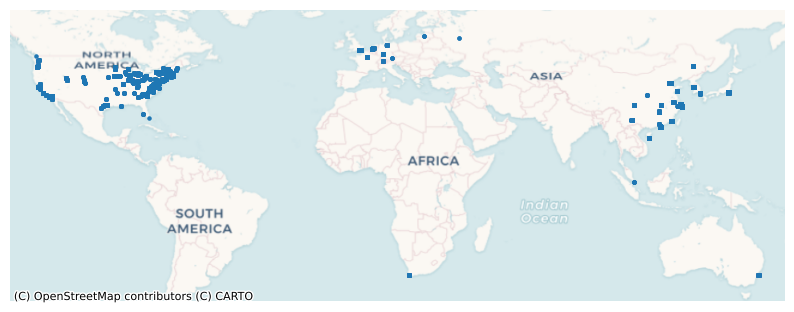

In [25]:
fig, ax = plt.subplots(figsize=(10, 10))
minx, miny, maxx, maxy = img_cen_gdf.total_bounds
ax.set_xlim(minx-10, maxx+10)
ax.set_ylim(miny-10, maxy+10)

img_cen_gdf.plot(ax=ax, markersize=5)
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Voyager)
ax.set_axis_off()
plt.show()

The images are mostly from cities in North America, China and Europe.  Also, I'd like to zoom in on  few of the image boundaries to check how nearby images are related.

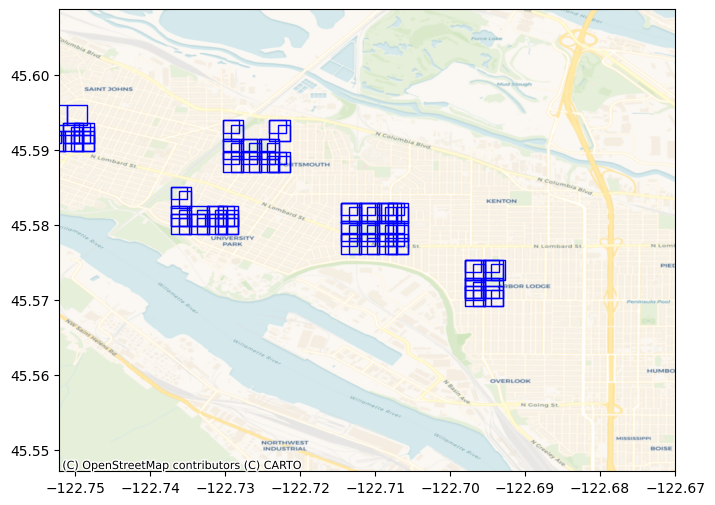

In [26]:
fig, ax = plt.subplots(figsize=(10, 6))
random_row = img_edges_gdf.sample(n=1)
minx, miny, maxx, maxy = random_row.total_bounds
ax.set_xlim(minx-0.04, maxx+0.04)
ax.set_ylim(miny-0.03, maxy+0.03)
filename = random_row.filename
img_edges_gdf.plot(ax=ax, color='none', edgecolor='blue', linewidth=1)
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Voyager)
plt.show()

Running the cell above a few times, it's clear that these images are often overlapping.  In some cases there are three or more images covering the same spot, with different total image sizes. The paper does mention 'seasonal' variation, but unfortunately without any date-time information there is no way to confirm if the annotations in these images are unique, or if the images are all cut from the same satellite pass, which would make many of the labels duplicates.

Another useful thing to do could be to put the image background in place, to check it lines up with the background world now they have the same projection.

In [27]:
def reproject_geotiff(source_path, temp_path, dst_crs):
    #https://rasterio.readthedocs.io/en/stable/topics/reproject.html
    with rasterio.open(source_path) as src:
        transform, width, height = calculate_default_transform(
            src.crs, dst_crs, src.width, src.height, *src.bounds)
        kwargs = src.meta.copy()
        kwargs.update({
            'crs': dst_crs,
            'transform': transform,
            'width': width,
            'height': height
        })

        with rasterio.open(temp_path, 'w', **kwargs) as dst:
            for i in range(1, src.count + 1):
                reproject(
                    source=rasterio.band(src, i),
                    destination=rasterio.band(dst, i),
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=transform,
                    dst_crs=dst_crs,
                    resampling=Resampling.nearest)
    
    image = rasterio.open(temp_path)    
    if os.path.exists(temp_path):
        os.remove(temp_path)
    return image


def plot_with_background(images, gdf):
    fig, ax = plt.subplots(figsize=(8, 8))
    if not in_kaggle:
        random_row = gdf.sample(n=1)
        tiff_path = data_dir / random_row['filename'].values[0]
    else:
        tiff_path = random.choice(images)
        tiff_nm = f'{tiff_path.parent.name}/{tiff_path.name}'
        random_row = gdf.loc[img_edges_gdf['filename'] == tiff_nm]
    print(tiff_path)
    print('Original CRS: ', random_row['crs'].values[0])
    print('Image width, height: ', random_row['ImageWidth'].values[0], random_row['ImageHeight'].values[0])
    minx, miny, maxx, maxy = random_row.total_bounds
    ax.set_xlim(minx-0.002, maxx+0.002)
    ax.set_ylim(miny-0.002, maxy+0.002)
    geotiff = reproject_geotiff(tiff_path, temp_destn_pth, 'EPSG:4326')
    ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.Esri.WorldImagery)
    show(geotiff, ax=ax, cmap='viridis')
    random_row.plot(ax=ax, color='none', edgecolor='blue', linewidth=1)
    plt.show()

/kaggle/input/fair1m-satellite-imagery-for-object-detection/Notebook_Working/val_images/7996.tif
Original CRS:  32651
Image width, height:  600 600


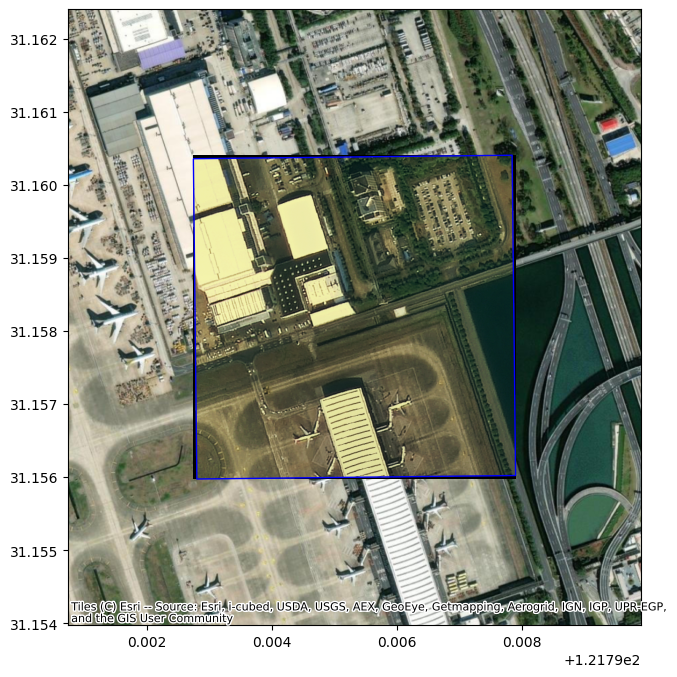

In [28]:
plot_with_background(example_images, img_edges_gdf)

I am also curious about the Ground Surface Distance of each pixel, in latitude and longitude.  Now I have extracted the position of the corners in spatial coordinates this is possible using the Haversine formula.

In [29]:
from math import radians, cos, sin, asin, sqrt

def haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6378137 # Radius of earth in meters, wsg84, semi-major axis
    return c * r

img_edges_gdf[['minx', 'miny', 'maxx', 'maxy']] = img_edges_gdf['geometry'].bounds
img_edges_gdf['spatial_width'] = img_edges_gdf.apply(lambda row: haversine(row['maxx'], row['miny'], row['minx'], row['miny']), axis=1)
img_edges_gdf['spatial_height'] = img_edges_gdf.apply(lambda row: haversine(row['minx'], row['maxy'],row['minx'], row['miny']), axis=1)
img_edges_gdf['long_GSD(m)'] = (img_edges_gdf['spatial_width'] / img_edges_gdf['ImageWidth']).round(decimals=3)
img_edges_gdf['lat_GSD(m)'] = (img_edges_gdf['spatial_height'] / img_edges_gdf['ImageHeight']).round(decimals=3)
cols_to_drop = ['minx', 'miny', 'maxx', 'maxy', 'spatial_width', 'spatial_height']
img_edges_gdf = img_edges_gdf.drop(columns=cols_to_drop)
img_edges_gdf.head()

,filename,Img_ID,split,ImageWidth,ImageHeight,geometry,crs,long_GSD(m),lat_GSD(m)
0,train_images/14154.tif,0,Train,1000,1000,"POLYGON ((122.09896 30.00726, 122.09896 30.001...",4326,0.517,0.597
1,train_images/412.tif,1,Train,1000,1000,"POLYGON ((-111.85050 40.76071, -111.85050 40.7...",4326,0.226,0.299
2,train_images/12718.tif,2,Train,1000,1000,"POLYGON ((118.12351 24.54661, 118.12345 24.539...",32650,0.816,0.821
3,train_images/8019.tif,3,Train,1000,1000,"POLYGON ((139.70008 35.49084, 139.70008 35.488...",4326,0.243,0.299
4,train_images/2454.tif,4,Train,600,800,"POLYGON ((-122.49682 47.24130, -122.49682 47.2...",4326,0.203,0.299


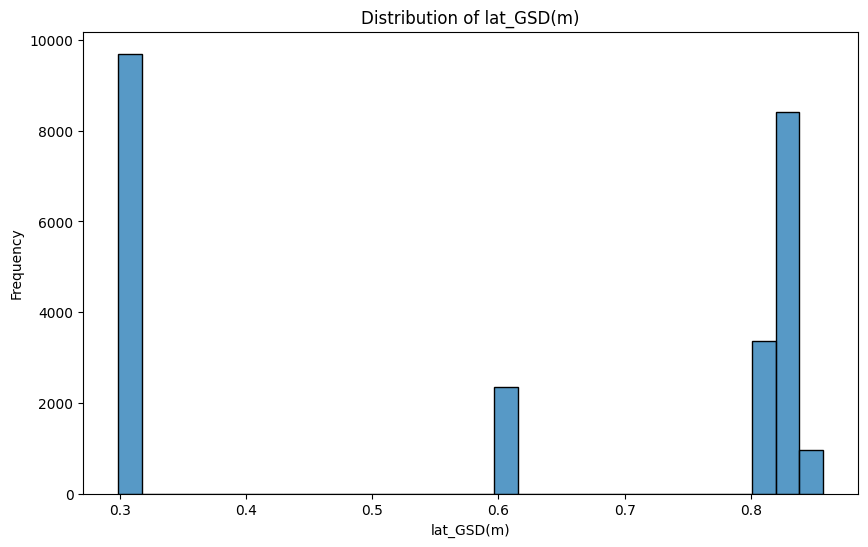

In [30]:
def plot_gsd(df,col_nm):
    plt.figure(figsize=(10, 6))
    sns.histplot(df[col_nm], kde=False, bins=30)
    plt.title(f'Distribution of {col_nm}')
    plt.xlabel(col_nm)
    plt.ylabel('Frequency')
    plt.show()

warnings.simplefilter(action='ignore', category=FutureWarning) # Suppress FutureWarning from seaborn
plot_gsd(img_edges_gdf, 'lat_GSD(m)')


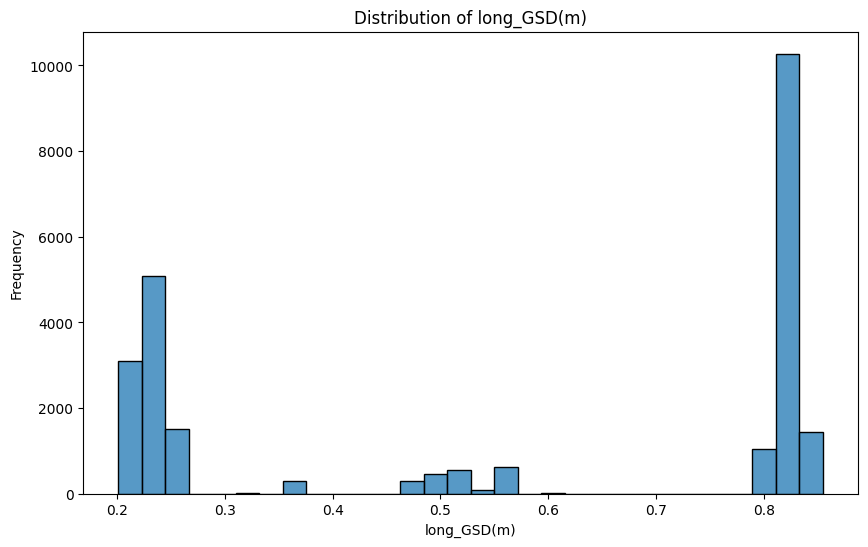

In [31]:
plot_gsd(img_edges_gdf, 'long_GSD(m)')
warnings.resetwarnings()

Since overlap might be an issue for splitting this dataset up later, or re-arranging it into non-contiguous images, I will attach a unique ID for each group of contiguous images.

In [32]:
def get_contiguous_geometries(gdf):
    unioned = gdf.unary_union
    dissolved_gdf = gpd.GeoDataFrame(geometry=[unioned], crs=gdf.crs).reset_index(drop=True)
    exploded_gdf = dissolved_gdf.explode(index_parts=False).reset_index(drop=True)
    exploded_gdf['Contig_Imgs_ID'] = exploded_gdf.index
    result = gpd.sjoin(gdf, exploded_gdf, how="left", predicate="intersects")
    result = result.drop(['index_right'], axis=1)
    return result

img_edges_gdf = get_contiguous_geometries(img_edges_gdf)
img_edges_gdf.head(5)

,filename,Img_ID,split,ImageWidth,ImageHeight,geometry,crs,long_GSD(m),lat_GSD(m),Contig_Imgs_ID
0,train_images/14154.tif,0,Train,1000,1000,"POLYGON ((122.09896 30.00726, 122.09896 30.001...",4326,0.517,0.597,623
1,train_images/412.tif,1,Train,1000,1000,"POLYGON ((-111.85050 40.76071, -111.85050 40.7...",4326,0.226,0.299,104
2,train_images/12718.tif,2,Train,1000,1000,"POLYGON ((118.12351 24.54661, 118.12345 24.539...",32650,0.816,0.821,592
3,train_images/8019.tif,3,Train,1000,1000,"POLYGON ((139.70008 35.49084, 139.70008 35.488...",4326,0.243,0.299,647
4,train_images/2454.tif,4,Train,600,800,"POLYGON ((-122.49682 47.24130, -122.49682 47.2...",4326,0.203,0.299,13


In [33]:
img_edges_gdf['Contig_Imgs_ID'].nunique()

771

There are just 771 non-contigous groups of images within this dataset.  However within each of these groups there will also be pairings that don't overlap, they are just joined by larger, or intermediate images.

## Validate the labels on the images
This is a good time to check the images, just to see if the bounding boxes make any sense, and understand any potential color channel problems that show up displaying them.

In [34]:
def display_images(image_list, max_images=6, no_cols=2, txt=False):
    total_ims = len(image_list)
    num_ims = min(max_images, total_ims)
    no_rows = num_ims//no_cols + (num_ims % no_cols > 0)
    image_list = random.sample(image_list,num_ims)
    #print(image_list)
    fig, axs = plt.subplots(no_rows, no_cols, figsize=(12, int(10*no_rows//(no_cols*3/4))))
    axs = axs.flatten()
    random.shuffle(image_list)
    for k, img_tuple in enumerate(image_list):
        img_pth = str(img_tuple[0])
        im = cv2.imread(img_pth)
        if im.dtype != np.uint8:
           im = (im * 255).astype(np.uint8)
        img_nm = Path(img_pth).name
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        for box_dict in img_tuple[6]:
            category = box_dict['Category']
            x0, x1, x2, x3 = box_dict['x0'], box_dict['x1'], box_dict['x2'], box_dict['x3']
            y0, y1, y2, y3 = box_dict['y0'], box_dict['y1'], box_dict['y2'], box_dict['y3']
            vertices = np.array([[x0, y0], [x1, y1], [x2, y2], [x3, y3]])
            vertices = vertices.reshape((-1, 1, 2)).astype(np.int32)
            x0 = int(x0)
            y0 = int(y0)
            cv2.polylines(im, [vertices], isClosed=True, color=(0, 255, 0), thickness=1)
            if txt:
                font_size = .8
                font_thickness = 1
                cv2.putText(im, str(category), (x0, y0-10), cv2.FONT_HERSHEY_SIMPLEX, font_size, (36,255,12), font_thickness )
        axs[k].set_title(f"Image {img_nm}, {im.shape}", fontsize = 12)
        axs[k].imshow(im)
        axs[k].axis('off')
        axs[k].set_axis_off()
    plt.tight_layout()
    plt.show()

In [35]:
if in_kaggle:
    index_dict = {item[0]: index for index, item in enumerate(list_of_tuples)}
    keep_idxs = [index_dict[item] for item in example_images]  #keys are path objects
    display_tuples = [list_of_tuples[i] for i in keep_idxs]
else:
    display_tuples = list_of_tuples

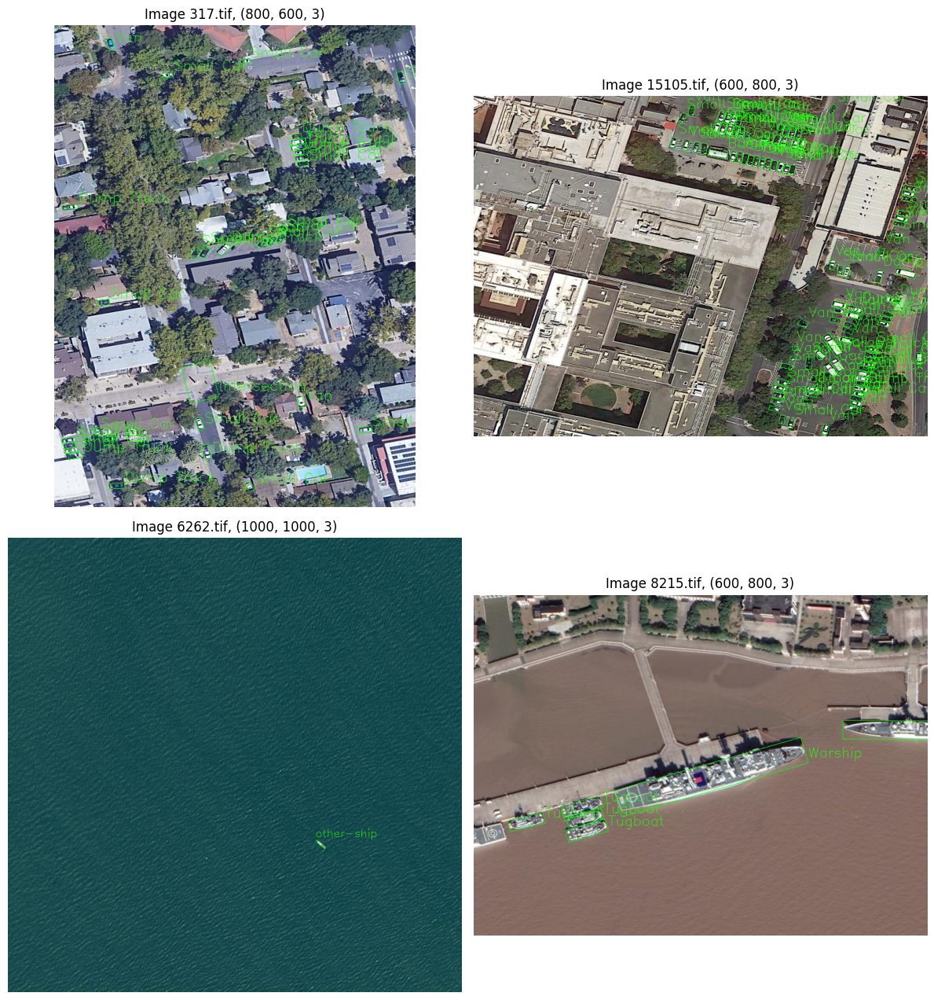

In [36]:
display_images(display_tuples, 4, 2, True)

Running the cells above a few times, you can see that cars and vans are not annotated in the large scale images (whilst ships, intersections and planes are), so if the dataset was to be used for the smallest objects, those images should be removed first.  This is discussed in the paper, the rationale being that those objects have too few pixels to be reliably detected.

# Convert the imagery and extract spatial data
At this point, all the information is in place to convert the tiff images into jpg, and extract the geospatial data into vector form.  But the images are still in a variety of projections, so I'll re-project all their box corners into a common system.

To get everything into a common geo dataframe, I'll identify the CRS of each image, and reproject the label boxes onto EPSG:4326 where necessary.

In [37]:
def pixels_to_polygon(bbox_points, src, transformer):
    x0, y0, x1, y1, x2, y2, x3, y3 = bbox_points.values()
    lon_0, lat_0 = src.xy(y0, x0)  # .xy(row_no, column_no)
    lon_1, lat_1 = src.xy(y1, x1)
    lon_2, lat_2 = src.xy(y2, x2)
    lon_3, lat_3 = src.xy(y3, x3)
    p_0 = Point(transformer.transform(lon_0, lat_0))
    p_1 = Point(transformer.transform(lon_1, lat_1))
    p_2 = Point(transformer.transform(lon_2, lat_2))
    p_3 = Point(transformer.transform(lon_3, lat_3))
    box = Polygon([p_0,p_1, p_2, p_3])
    return box


def process_tuple(img_tuple):
    tiff_path, jpg_path, split, img_id, width, height, pixel_labels = img_tuple
    geo_labels = []

    with rasterio.open(tiff_path) as src:
        crs = int(src.crs.to_epsg())
        source_crs = pyproj.CRS.from_epsg(crs)
        target_crs = pyproj.CRS.from_epsg(4326)
        transformer = pyproj.Transformer.from_crs(source_crs, target_crs, always_xy=True)

        for annotation in pixel_labels:
            label_dict = {}
            keys= ['x0', 'y0', 'x1', 'y1', 'x2', 'y2', 'x3', 'y3']
            bbox_dict = {key: annotation[key] for key in keys}
            label_dict['tiff_file_name'] = os.path.join(tiff_path.parent.name, tiff_path.name)
            label_dict['jpg_file_name'] = Path(jpg_path).name
            label_dict['Split'] = split
            label_dict['Img_ID'] = img_id
            label_dict['Label_ID'] = annotation['Label_ID']
            label_dict['Category'] = annotation['Category']
            label_dict['geometry'] = pixels_to_polygon(bbox_dict, src, transformer)
            label_dict['Img_Width'] = width
            label_dict['Img_Height'] = height
            geo_labels.append(label_dict)
    return geo_labels

In [38]:
if not in_kaggle:
    geo_label_dicts= Parallel(n_jobs=8)(delayed(process_tuple)(item)for item in tqdm_notebook(list_of_tuples))
    flattened_list = [item for sublist in geo_label_dicts for item in sublist]
    geo_label_df = pd.DataFrame(flattened_list)
    gdf = GeoDataFrame(geo_label_df, crs="epsg:4326") 
    gdf.to_parquet(geo_labels_working)
else:
    gdf = gpd.read_parquet(geo_labels_working)

In [39]:
gdf.head()

,tiff_file_name,jpg_file_name,Split,Img_ID,Label_ID,Category,geometry,Img_Width,Img_Height
0,train_images/14154.tif,t_14154.jpg,Train,0,0,Warship,"POLYGON ((122.09890 30.00414, 122.10023 30.003...",1000,1000
1,train_images/14154.tif,t_14154.jpg,Train,0,1,Warship,"POLYGON ((122.09895 30.00428, 122.10029 30.003...",1000,1000
2,train_images/14154.tif,t_14154.jpg,Train,0,2,Dry Cargo Ship,"POLYGON ((122.10356 30.00334, 122.10348 30.003...",1000,1000
3,train_images/14154.tif,t_14154.jpg,Train,0,3,Dry Cargo Ship,"POLYGON ((122.10360 30.00239, 122.10365 30.002...",1000,1000
4,train_images/412.tif,t_412.jpg,Train,1,4,Cargo Truck,"POLYGON ((-111.85016 40.75981, -111.85024 40.7...",1000,1000


And varify that we have polygons in the geometry column

In [40]:
for geom_type in gdf['geometry'].geom_type.unique():
    print(geom_type)

Polygon


Since there are 500,000 annotations, I won't try to display them all.  Just select a few regions of curiousity, and check they look OK.

In [41]:
shuangliu = [103.925, 30.55,  104, 30.6]
cape_town = [18.4,  -33.93, 18.46, -33.89]
vancouver = [-123.225, 49.25, -123.1, 49.35]

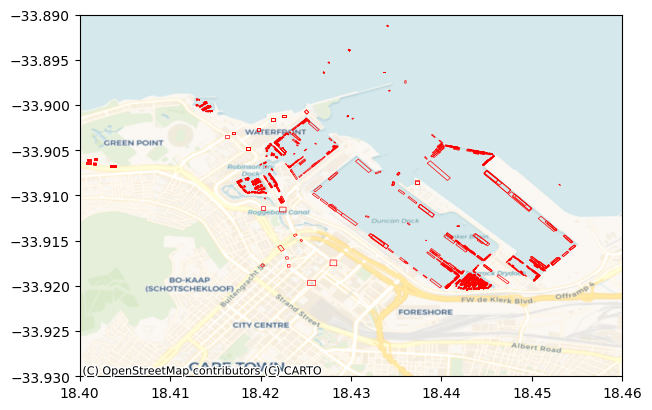

In [42]:
def plot_region(full_gdf, region):
    fig, ax = plt.subplots(figsize=(7, 10))
    minx, miny, maxx, maxy = region
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)
    region_box = box(minx, miny, maxx, maxy)
    region_gdf = full_gdf[full_gdf.geometry.within(region_box)]
    region_gdf.plot(ax=ax, color='none', facecolor='none', edgecolor='red', linewidth=0.5)
    ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Voyager)
    plt.show()

plot_region(gdf, cape_town)
#plot_region(gdf, vancouver)
#plot_region(gdf, shuangliu)

Now let's bring this all to together and plot a random GeoTiff, along with it's labels, with a background map for context, all in WGS84 (EPSG4326) to validate all the spatial transforms and data extraction.

/kaggle/input/fair1m-satellite-imagery-for-object-detection/Notebook_Working/train_images/1411.tif
/kaggle/temp/temp_geotiff.tif
Original CRS:  4326
Image width, height:  1000 1000


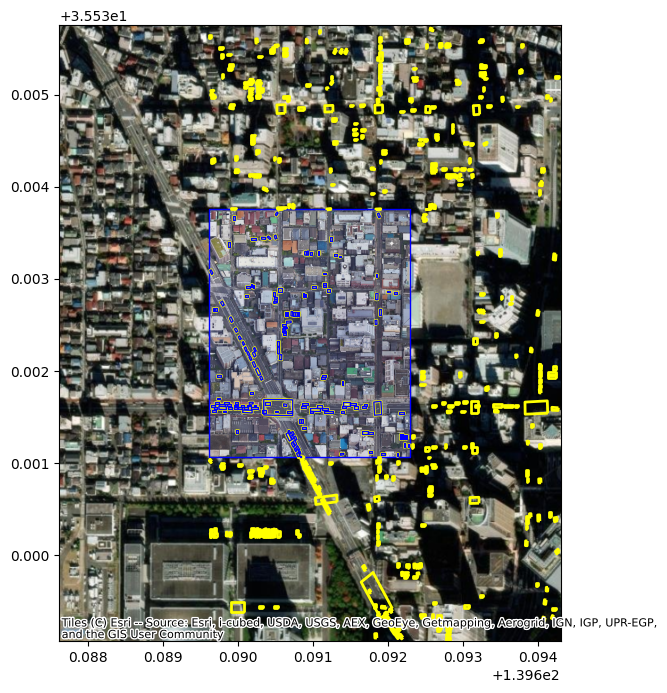

In [43]:
fig, ax = plt.subplots(figsize=(8, 8))

geotiff_path = random.sample(example_images,1)[0]
tiff_filename = f'{geotiff_path.parent.name}/{geotiff_path.name}'
random_row = img_edges_gdf.loc[img_edges_gdf['filename'] == tiff_filename]

if not in_kaggle:
    random_row = img_edges_gdf.sample(n=1)
    tiff_filename = random_row['filename'].values[0]
    geotiff_path = data_dir / tiff_filename
    temp_destn_pth = geotiff_path.parent.parent / 'temp_geotiff.tif'
    
print(geotiff_path)
print(temp_destn_pth)
print('Original CRS: ', random_row['crs'].values[0])
print('Image width, height: ', random_row['ImageWidth'].values[0], random_row['ImageHeight'].values[0])
buffer= 0.002
minx, miny, _, _  = random_row.total_bounds - buffer
_ , _ , maxx, maxy  = random_row.total_bounds + buffer
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)
geotiff = reproject_geotiff(geotiff_path, temp_destn_pth, 'EPSG:4326')
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.Esri.WorldImagery)
show(geotiff, ax=ax, cmap='viridis')
random_row.plot(ax=ax, color='none', edgecolor='blue', linewidth=1)
region_box = box(minx, miny, maxx, maxy)
region_gdf = gdf[gdf.geometry.within(region_box)]
image_gdf = region_gdf[region_gdf['tiff_file_name'].apply(lambda x: os.path.basename(x) == Path(tiff_filename).name)]

if len(region_gdf) > 0:
    region_gdf.plot(ax=ax, color='none', facecolor='none', edgecolor='yellow', linewidth=2)
    if len(image_gdf) > 0:
        image_gdf.plot(ax=ax, color='none', facecolor='none', edgecolor='blue', linewidth=1)

plt.show()

I plotted any labels from other image samples in yellow with a slightly wider line width, to highlight overlap, and nearby labels.  It appears that vehicle label positions are often repeated exactly between overlapping in this dataset, suggesting there is a lot of duplication of imagery, since vehicles shouldn't normally be in exactly the same location for multiple satellite passes.

This high degree of overlap is really a bit of a concern.  Although it's OK to have different image crop positions from a larger image for training data augmentation, this would be better handled as part of the data-loading process, not fixed into the dataset its self.  Potentially this dataset has far fewer unique labels than claimed.  I'm going to have a little look at this for each class, though in some cases, they could be genuinely unique vehicles, parked in the same spot.  For example a Boeing 737 might always be connected to an airport terminal gate at the same location, but its a different colored plane each time, this would be OK for training. 

It also appears that some of the bounding boxes are not rectangles, they have angled ends.  I imagine that is probably just an error in the data entry process, but might need correcting, depending on the end-use for this.

I'll start by looking at how many of these labels from the same category are spatially non-contiguous.

In [44]:
def get_contiguous_geometries(gdf):
    unioned = gdf.unary_union
    dissolved_gdf = gpd.GeoDataFrame(geometry=[unioned], crs=gdf.crs).reset_index(drop=True)
    exploded_gdf = dissolved_gdf.explode(index_parts=False).reset_index(drop=True)
    exploded_gdf['Contig_Labels_ID'] = exploded_gdf.index
    result = gpd.sjoin(gdf, exploded_gdf, how="left", predicate="intersects")
    result = result.drop(['index_right'], axis=1)
    return result

In [45]:
gdf = gdf.groupby('Category').apply(get_contiguous_geometries).reset_index(drop=True)
gdf.head(5)

,tiff_file_name,jpg_file_name,Split,Img_ID,Label_ID,Category,geometry,Img_Width,Img_Height,Contig_Labels_ID
0,train_images/12718.tif,t_12718.jpg,Train,2,28,A220,"POLYGON ((118.13070 24.54401, 118.13101 24.544...",1000,1000,870.0
1,train_images/12718.tif,t_12718.jpg,Train,2,29,A220,"POLYGON ((118.13139 24.54340, 118.13117 24.543...",1000,1000,867.0
2,train_images/12718.tif,t_12718.jpg,Train,2,30,A220,"POLYGON ((118.13105 24.54315, 118.13081 24.543...",1000,1000,867.0
3,train_images/12718.tif,t_12718.jpg,Train,2,33,A220,"POLYGON ((118.13007 24.54243, 118.12984 24.542...",1000,1000,863.0
4,train_images/12718.tif,t_12718.jpg,Train,2,36,A220,"POLYGON ((118.13103 24.54138, 118.13080 24.541...",1000,1000,857.0


In [46]:
for geom_type in gdf['geometry'].geom_type.unique():
    print(geom_type)

Polygon


In [47]:
gdf['Concatenated'] = gdf['Contig_Labels_ID'].astype(str) + '_' + gdf['Category'].astype(str)
gdf= gdf.sort_values(by='Concatenated').reset_index(drop=True)
gdf['Contig_Labels_ID'] = gdf.groupby('Concatenated').ngroup() + 1
gdf.drop(columns=['Concatenated'], inplace=True)
gdf = gdf.sort_values(by=['tiff_file_name']).reset_index(drop=True)
gdf.head(3)

,tiff_file_name,jpg_file_name,Split,Img_ID,Label_ID,Category,geometry,Img_Width,Img_Height,Contig_Labels_ID
0,train_images/0.tif,t_0.jpg,Train,741,17876,Liquid Cargo Ship,"POLYGON ((-118.17015 33.73499, -118.16897 33.7...",1500,1500,4879
1,train_images/0.tif,t_0.jpg,Train,741,17877,Passenger Ship,"POLYGON ((-118.17361 33.73528, -118.17385 33.7...",1500,1500,62
2,train_images/0.tif,t_0.jpg,Train,741,17878,Dry Cargo Ship,"POLYGON ((-118.17382 33.72923, -118.17291 33.7...",1500,1500,39186


In [48]:
gdf['Contig_Labels_ID'].nunique()

241262

Apparently about there are only half as many (241,262/590,886 ) unique locations labelled as there are total labels.  At this point it's also possible to find how many spatially non-contiguous labels there are per category

In [49]:
category_counts = gdf.groupby('Category')['Contig_Labels_ID'].nunique().reset_index(name='Count')
category_counts = category_counts.sort_values(by='Count', ascending=False)

I'd like to visualise the spatially non-contiguous label counts to help decide which classes would be most suitable for object detection projects

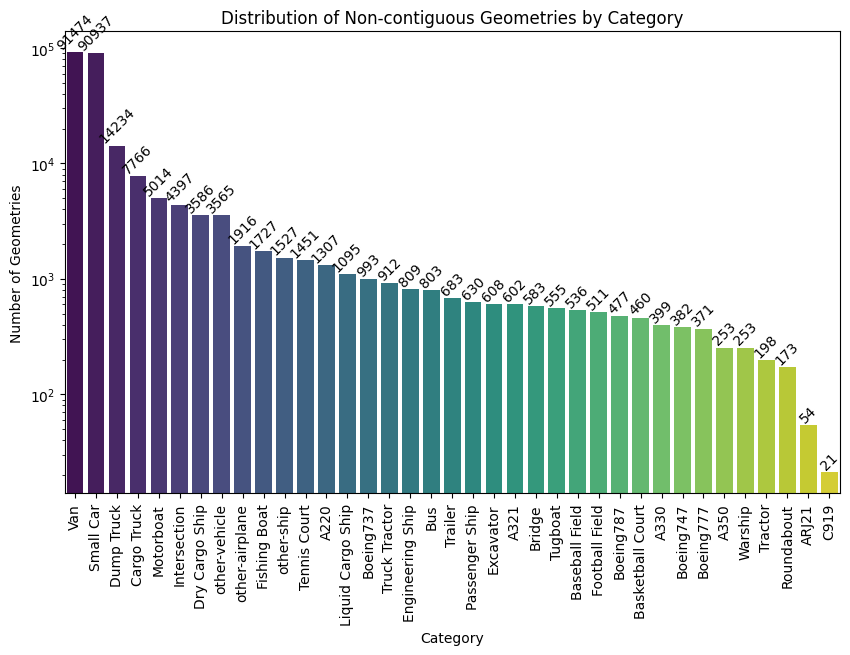

In [50]:
# Suppress FutureWarning related to is_categorical_dtype
warnings.simplefilter(action='ignore', category=FutureWarning)
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='Category', y='Count', data=category_counts, palette='viridis')
plt.xlabel('Category')
plt.ylabel('Number of Geometries')
plt.yscale('log')
for index, value in enumerate(category_counts['Count']):
    ax.text(index, value, str(value), ha='center', va='bottom', rotation=45)
plt.xticks(rotation=90)
plt.title('Distribution of Non-contiguous Geometries by Category')
plt.show()
warnings.resetwarnings()

By far the largest categories in this dataset are 'Van' and 'Small Car'  with 91,470 & 90,931 classes respectively.  

However to use this dataset in an object detection project, and get realistic perfomance statistics from it we need to ensure the test set has no overlap with any of the training data.  So I will join the unique spatial identifier, back into the flattened labels dataframe.  That way people can arange the labels however they like with Pandas filtering and grouping operations.  The easiest approach would actually to be to use the image grouping ID, so seperate the images by the 751 non-contiguous image groups.

In [51]:
labels_df = df.merge(gdf[['Contig_Labels_ID', 'Label_ID']], on='Label_ID', how='left').copy()
int_cols = ['Img_ID', 'Label_ID', 'x0', 'y0', 'x1', 'y1', 'x2','y2', 'x3', 'y3','ImageWidth','ImageHeight','x_min','y_min','x_max','y_max'] #There seem some na values for spatialid
labels_df[numerical_columns] = labels_df[int_cols].astype('int32')
labels_df.head(3)

,FilePath,Split,Img_ID,Label_ID,Category,x0,y0,x1,y1,x2,y2,x3,y3,ImageWidth,ImageHeight,x_min,y_min,x_max,y_max,Contig_Labels_ID
0,/kaggle/input/fair1m-satellite-imagery-for-obj...,Train,0,0,A220,670,233,623,257,644,296,690,272,1000,1000,623,233,690,296,25035
1,/kaggle/input/fair1m-satellite-imagery-for-obj...,Train,0,1,other-airplane,370,714,305,746,333,803,398,771,1000,1000,305,714,398,803,25035
2,/kaggle/input/fair1m-satellite-imagery-for-obj...,Train,1,2,Small Car,515,368,492,369,492,363,515,361,600,800,492,361,515,369,53078


Finally let's validate the jpg images and check the labels make sense on those.

In [52]:
contiguous_images = img_edges_gdf[['Img_ID', 'Contig_Imgs_ID']].astype('int32').copy()
contiguous_images.head()

,Img_ID,Contig_Imgs_ID
0,0,623
1,1,104
2,2,592
3,3,647
4,4,13


In [53]:
labels_df = labels_df.merge(contiguous_images, on='Img_ID', how='left')

In [54]:
column_order = ['FilePath','Category', 'Split', 'x0', 'y0', 'x1', 'y1', 'x2', 'y2', 'x3', 'y3', 'ImageWidth', 'ImageHeight', 'Img_ID', 'Label_ID', 'Contig_Labels_ID', 'Contig_Imgs_ID', 'x_min', 'y_min', 'x_max', 'y_max']	
labels_df = labels_df[column_order]
labels_df.head(3)

,FilePath,Category,Split,x0,y0,x1,y1,x2,y2,x3,...,ImageWidth,ImageHeight,Img_ID,Label_ID,Contig_Labels_ID,Contig_Imgs_ID,x_min,y_min,x_max,y_max
0,/kaggle/input/fair1m-satellite-imagery-for-obj...,A220,Train,670,233,623,257,644,296,690,...,1000,1000,0,0,25035,623,623,233,690,296
1,/kaggle/input/fair1m-satellite-imagery-for-obj...,other-airplane,Train,370,714,305,746,333,803,398,...,1000,1000,0,1,25035,623,305,714,398,803
2,/kaggle/input/fair1m-satellite-imagery-for-obj...,Small Car,Train,515,368,492,369,492,363,515,...,600,800,1,2,53078,104,492,361,515,369


In [55]:
img_edges_gdf.head(3)

,filename,Img_ID,split,ImageWidth,ImageHeight,geometry,crs,long_GSD(m),lat_GSD(m),Contig_Imgs_ID
0,train_images/14154.tif,0,Train,1000,1000,"POLYGON ((122.09896 30.00726, 122.09896 30.001...",4326,0.517,0.597,623
1,train_images/412.tif,1,Train,1000,1000,"POLYGON ((-111.85050 40.76071, -111.85050 40.7...",4326,0.226,0.299,104
2,train_images/12718.tif,2,Train,1000,1000,"POLYGON ((118.12351 24.54661, 118.12345 24.539...",32650,0.816,0.821,592


In [56]:
gdf.head(3)

,tiff_file_name,jpg_file_name,Split,Img_ID,Label_ID,Category,geometry,Img_Width,Img_Height,Contig_Labels_ID
0,train_images/0.tif,t_0.jpg,Train,741,17876,Liquid Cargo Ship,"POLYGON ((-118.17015 33.73499, -118.16897 33.7...",1500,1500,4879
1,train_images/0.tif,t_0.jpg,Train,741,17877,Passenger Ship,"POLYGON ((-118.17361 33.73528, -118.17385 33.7...",1500,1500,62
2,train_images/0.tif,t_0.jpg,Train,741,17878,Dry Cargo Ship,"POLYGON ((-118.17382 33.72923, -118.17291 33.7...",1500,1500,39186


In [57]:
def geotiff_to_jpg(in_path, out_path):
    jpeg_quality = 95
    img = cv2.imread(str(in_path))
    if img is None:
        print(f'Failed to load {in_path}')
        return None
    else:
        num_bands = img.shape[2] if len(img.shape) == 3 else 1
        bit_depth = img.dtype
    if bit_depth == 'float32':
        img = (img * 255).clip(0, 255).astype(np.uint8)
    if num_bands == 4:  # If there are 4 bands, assume it's RGBA, and we only need RGB
        img = img[:, :, :0:3]
    cv2.imwrite(str(out_path), img, [cv2.IMWRITE_JPEG_QUALITY, jpeg_quality])
    return


In [58]:
if (not in_kaggle) and (not train_img_dir.exists()) and (not val_img_dir.exists()):
    for folder in [train_img_dir, val_img_dir]:
        folder.mkdir(parents=True)
        
    _ = Parallel(n_jobs=-1, prefer='threads')(delayed(geotiff_to_jpg)(item[0], item[1])for item in tqdm_notebook(list_of_tuples))

Now to validate the jpg images work and check out what's going on with the overlap in each Contiguous images group

In [59]:
def display_jpg_images(df, no_cols=2, txt=False):
    img_ids = df['Img_ID'].unique()
    num_ims = len(img_ids)
    no_rows = num_ims//no_cols + (num_ims % no_cols > 0)

    fig, axs = plt.subplots(no_rows, no_cols, figsize=(12, int(10*no_rows//(no_cols*3/4))))
    axs = axs.flatten()
    for k, id in enumerate(img_ids):
        img_df = df[df['Img_ID']==id]
        img_pth = img_df.iloc[0, img_df.columns.get_loc('FilePath')]
        im = cv2.imread(img_pth)
        img_nm = Path(img_pth).name
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        for row in img_df.itertuples():
            category = row.Category
            split = row.Split
            x0, x1, x2, x3 = row.x0, row.x1, row.x2, row.x3
            y0, y1, y2, y3 = row.y0, row.y1, row.y2, row.y3
            vertices = np.array([[x0, y0], [x1, y1], [x2, y2], [x3, y3]])
            vertices = vertices.reshape((-1, 1, 2)).astype(np.int32)
            x0 = int(x0)
            y0 = int(y0)
            cv2.polylines(im, [vertices], isClosed=True, color=(0, 255, 0), thickness=1)
            if txt:
                font_size = .8
                font_thickness = 1
                cv2.putText(im, str(category), (x0, y0-10), cv2.FONT_HERSHEY_SIMPLEX, font_size, (36,255,12), font_thickness )
        axs[k].set_title(f"Image {img_nm}, {split}, {im.shape}", fontsize = 12)
        axs[k].imshow(im)
        axs[k].axis('off')
        axs[k].set_axis_off()
    if num_ims % no_cols > 0:
        fig.delaxes(axs[num_ims])
    plt.tight_layout()
    plt.show()

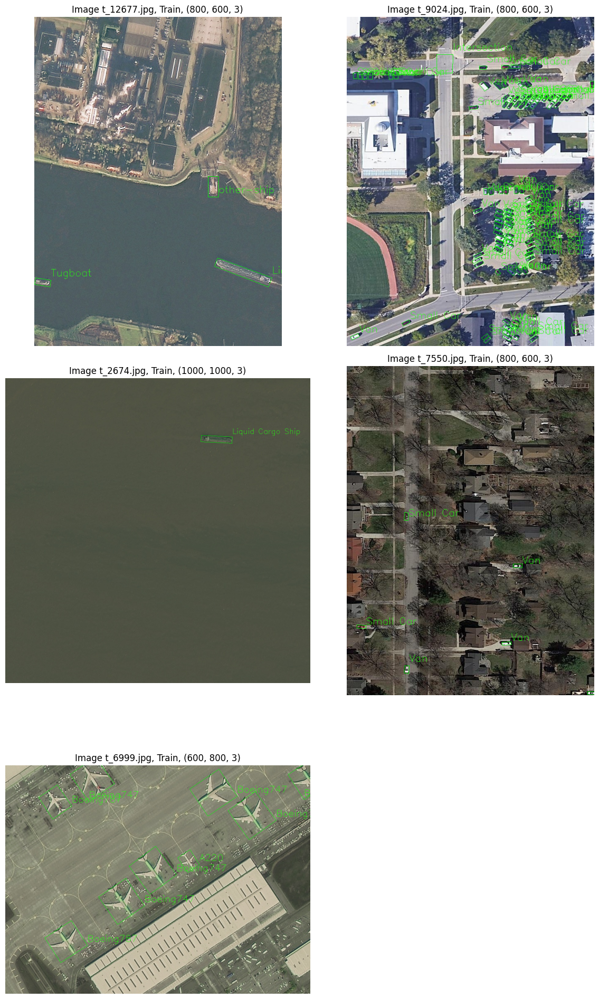

In [60]:
unique_contiguous = labels_df['Contig_Imgs_ID'].unique()
random_sample = (pd.Series(unique_contiguous).sample(n=1)).iloc[0]
to_plot_df = labels_df[labels_df['Contig_Imgs_ID']==random_sample]
display_jpg_images(to_plot_df, 2, True)

Running this a few times it's clear that the overlapping images are all from the training set, not the validation set.  And generally have the same resolution and are from the same time (since the cars are always the same colour and location).  They have just been cut up from a larger raster in varying ways.  This is OK for the training & validation set, but it means that any test set is going to need to use the inique ID's for contiguous image groupings.  Otherwise test metrics will be meaningless as the images will be correlated to the training images.

Finally I'd like to save out all the labels and vector files, in formats for efficient loading back into Python.  I'll use Parquet for this, since they are fast and efficient, for all the data types being used here.

In [61]:
if not in_kaggle:
    img_cen_gdf.to_parquet(img_centres_gdf_pth)  # The image centres
    img_edges_gdf.to_parquet(img_boundaries_gdf_pth) # The image boundary spatial locations, ground surface distance, size
    gdf.to_parquet(labels_gdf_pth) #The labels geoPandas dataframe
    df.to_parquet(labels_df_pth)  #The labels Pandas dataframe

## Conclusion
Actually I suspect for many people the [xView-1](https://www.kaggle.com/datasets/ollypowell/xview-yolo-dataset) dataset that I adapted earlier would be easier to work with. xView-1 has 601,937 labels, better geographical diversity, a consistant ground surface distance of 0.3m, and I've cropped to a constant tile size.

That said, FAIR1M has 241,262 spatially unique labels, with a couple of key points of difference from many similar datasets:

- I has genuine high resolution satellite imagery (0.3m - 0.8m).  Many datasets claiming this are actually aerial photography. 
- It uses oriented bounding boxes, which may be a requirement for some use cases.

If I was to take this project any further, my next steps would be something like this:

- Decide on a use-case (eg. small vehicles, with car & van), and an appropriate spatial resolution.
- Filter out all the images and labels at an unsuitable resolution, especially if I'm trying to detect the small objects like cars and vans, since those were deliberately excluded from the lowest resolution images.  If doing this in real life, we would be doing inference from a constant source of imagery, so I think it is reasonable to train a model on a fairly narrow range of spatial resolution.
- Use the inique ID's for the contiguous images to seperate out a test set from the training data.
- Build and test an object detection model.

Thanks very much to the organisers of the Geofen Challenge for making this valuable data available for educational purposes.